In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from pandas_profiling import ProfileReport
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNet,ElasticNetCV,Ridge,RidgeCV,Lasso,LassoCV,LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix,roc_curve,roc_auc_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
import seaborn as sns

In [2]:
df = pd.read_csv('diabetes.csv')
df.head(20)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


In [3]:
pr = ProfileReport(df)
pr.to_file('ProfileReport.html')

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
df.head(2)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0


In [5]:
df['BMI'] = df['BMI'].replace(0,df['BMI'].mean()) # BMI column is updated my mean value of BMI

In [6]:
df['BloodPressure'] = df['BloodPressure'].replace(0,df['BloodPressure'].mean())

In [7]:
df['Insulin'] = df['Insulin'].replace(0,df['Insulin'].mean())

In [8]:
df['Glucose'] = df['Glucose'].replace(0,df['Glucose'].mean())

In [9]:
df['SkinThickness'] = df['SkinThickness'].replace(0,df['SkinThickness'].mean())

In [10]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [11]:
final_pf = ProfileReport(df)
final_pf.to_file('finalProfileReport.html')

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

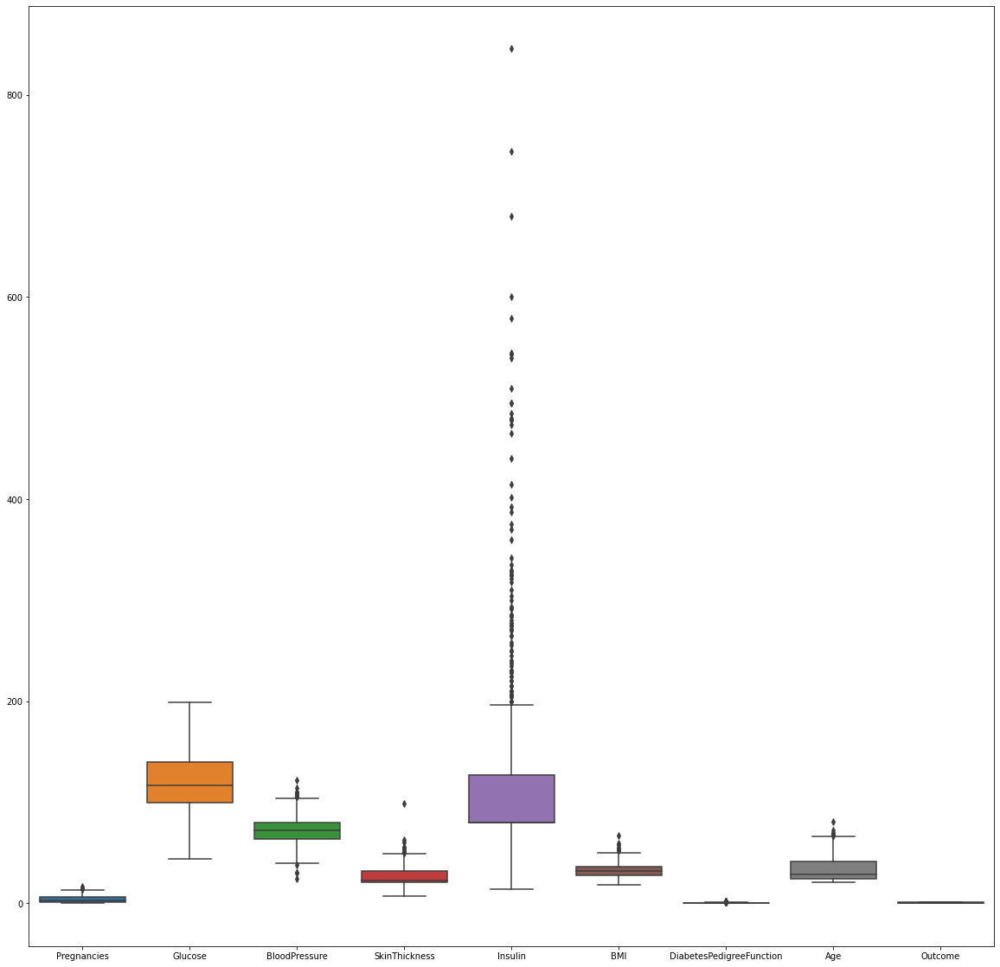

In [12]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df, ax = ax)

In [13]:
q = df['Insulin'].quantile(0.70)
new_df = df[df['Insulin']<q]

<AxesSubplot:>

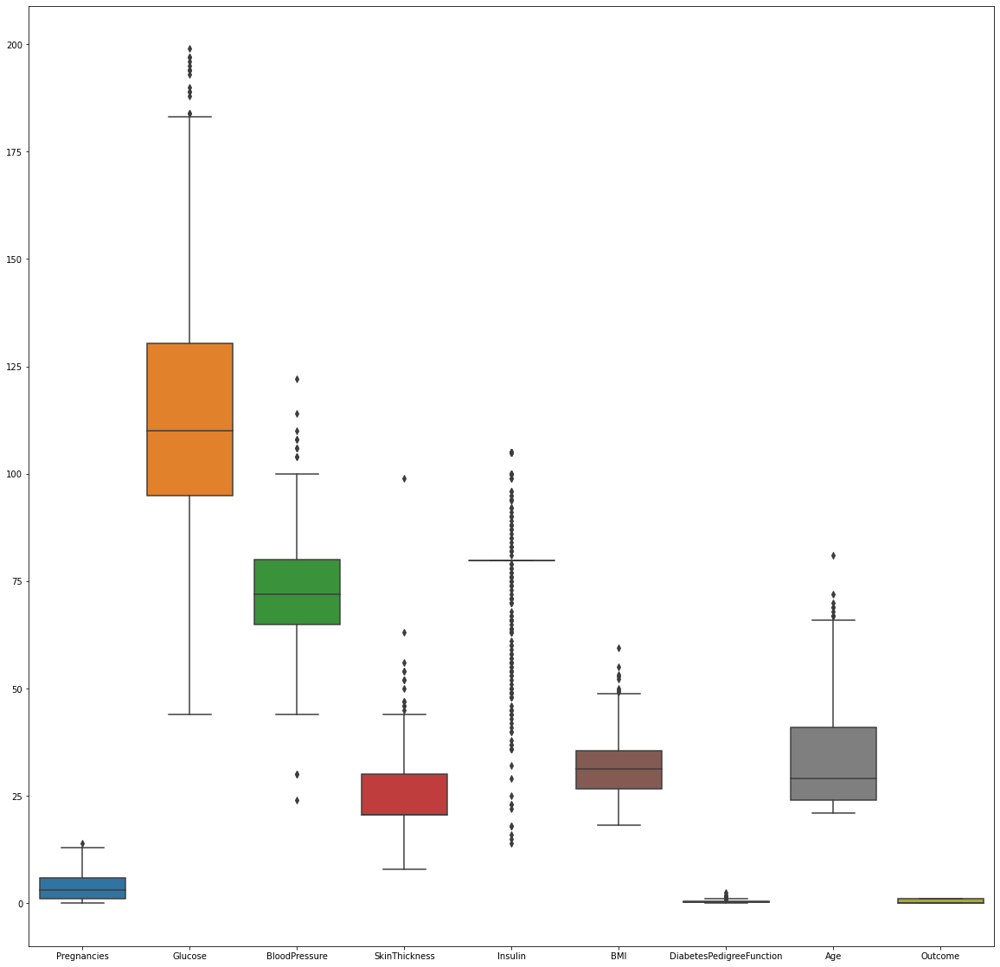

In [14]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = new_df, ax = ax)

In [15]:
q = df['Pregnancies'].quantile(0.98)
new_df = df[df['Pregnancies']<q]

<AxesSubplot:>

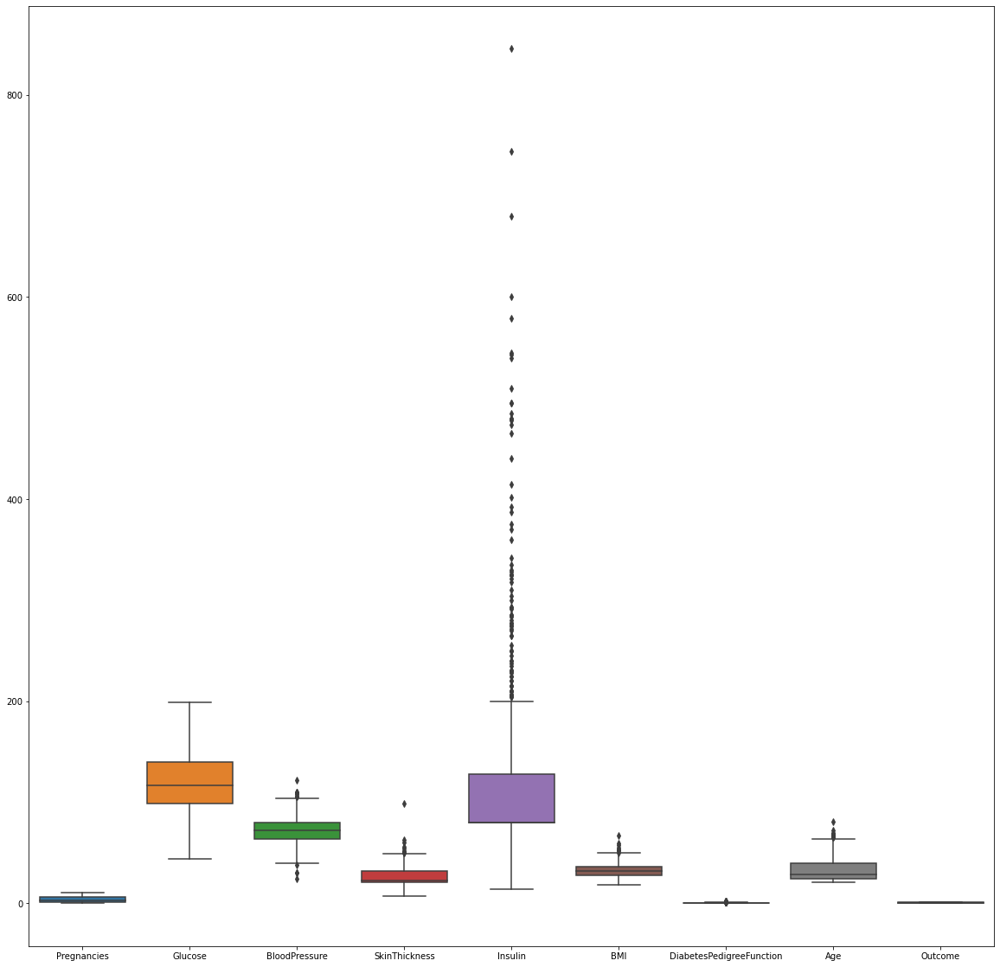

In [16]:
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = new_df, ax = ax)

<AxesSubplot:>

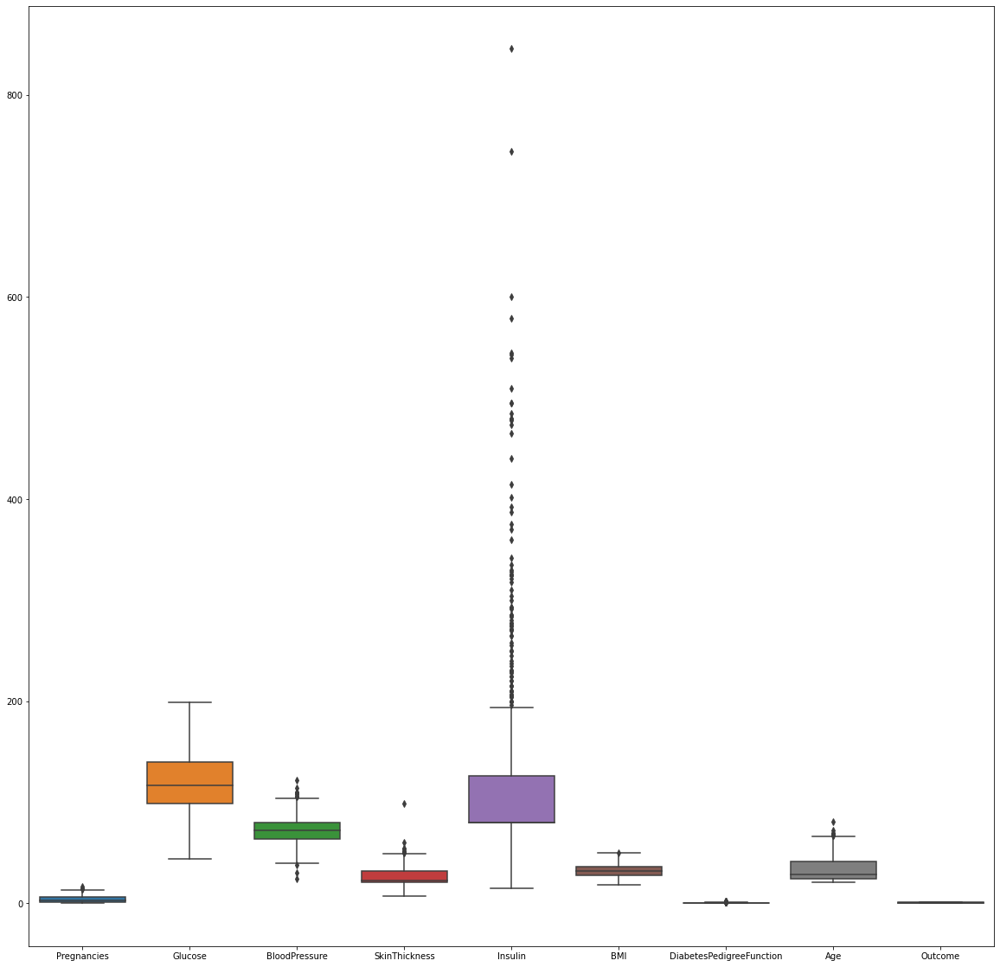

In [17]:
q = df['BMI'].quantile(0.99)
new_df = df[df['BMI']<q]
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = new_df, ax = ax)

<AxesSubplot:>

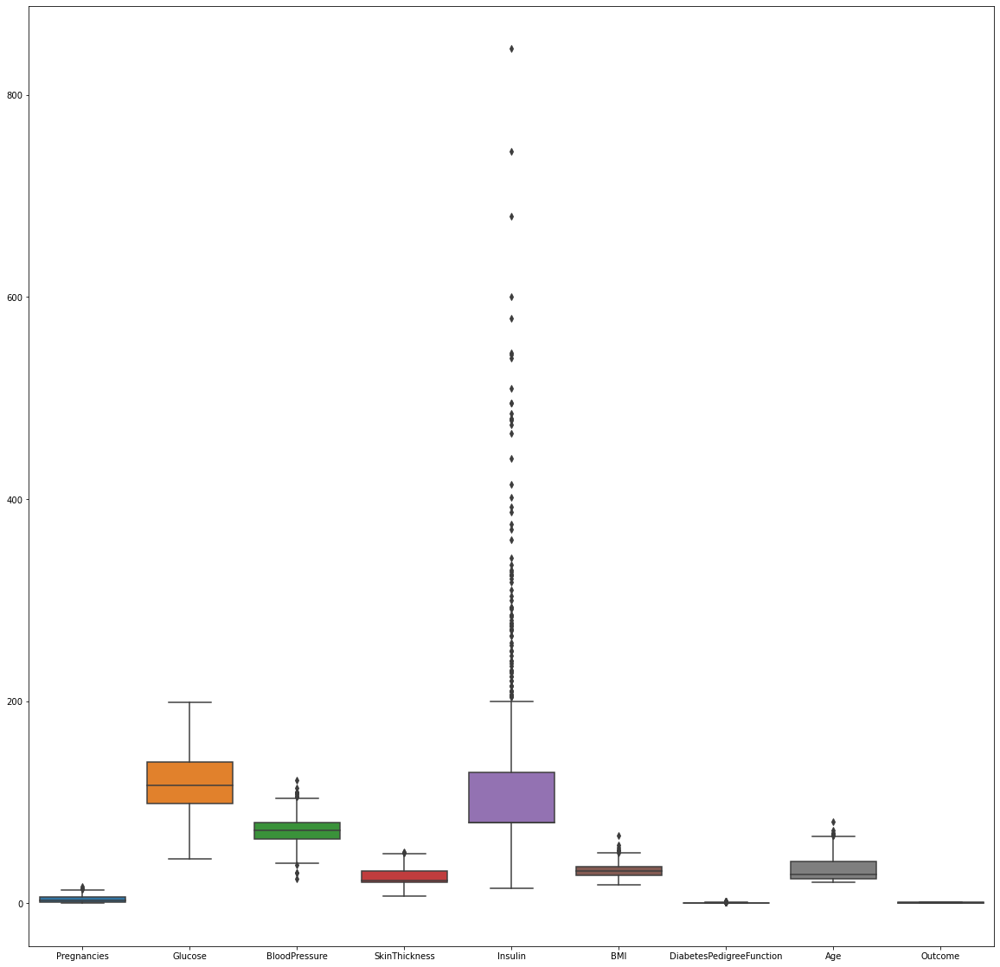

In [18]:
q = df['SkinThickness'].quantile(0.99)
new_df = df[df['SkinThickness']<q]
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = new_df, ax = ax)

<AxesSubplot:>

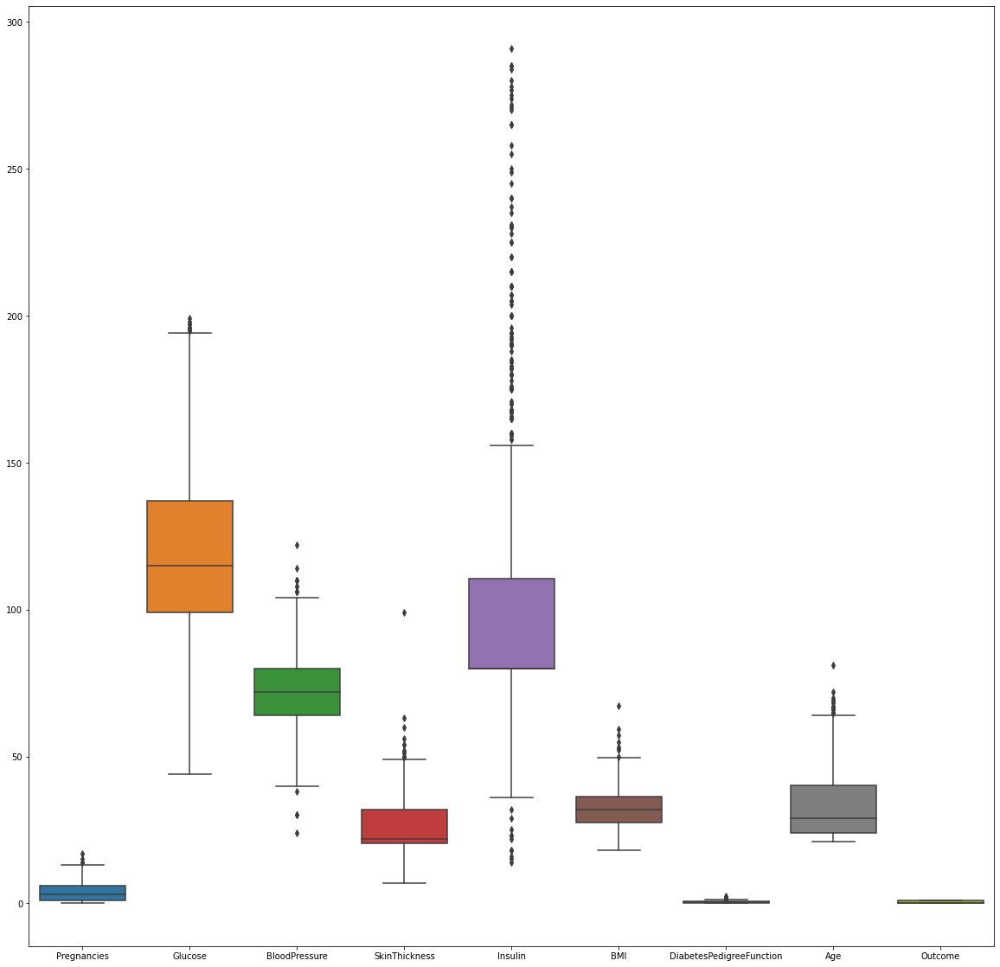

In [19]:
q = df['Insulin'].quantile(0.95)
new_df = df[df['Insulin']<q]
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = new_df, ax = ax)

<AxesSubplot:>

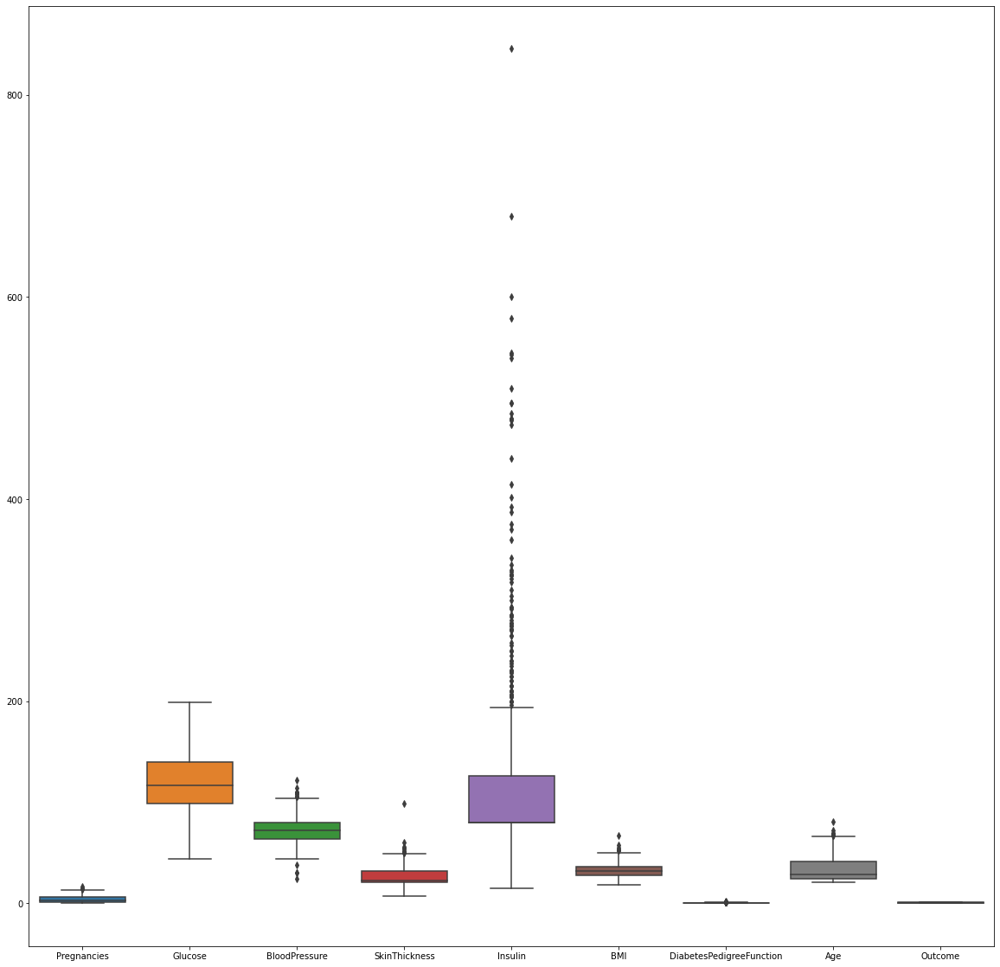

In [20]:
q = df['DiabetesPedigreeFunction'].quantile(0.99)
new_df = df[df['DiabetesPedigreeFunction']<q]
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = new_df, ax = ax)

<AxesSubplot:>

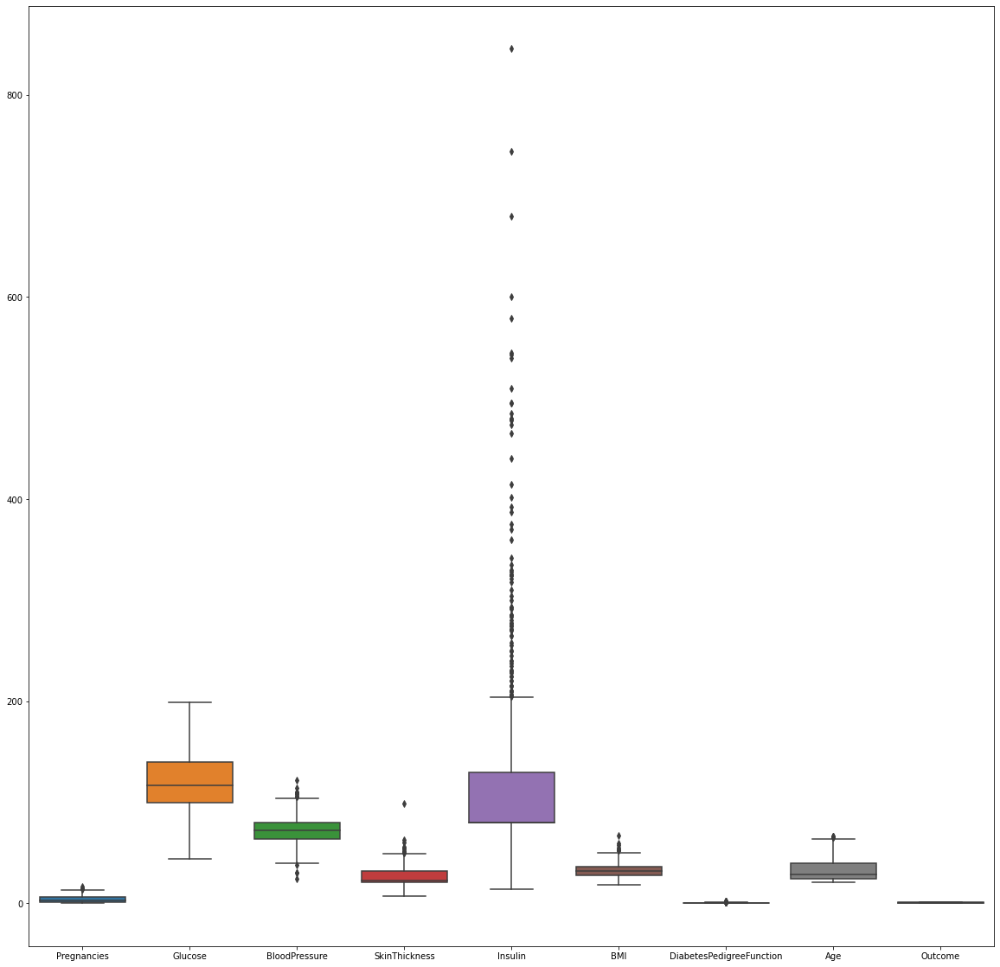

In [21]:
q = df['Age'].quantile(0.99)
new_df = df[df['Age']<q]
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = new_df, ax = ax)

In [22]:
ProfileReport(new_df)

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [23]:
y = new_df['Outcome']
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 759, dtype: int64

In [24]:
x = new_df.drop(columns=['Outcome'])
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [25]:
scalar = StandardScaler()
ProfileReport(pd.DataFrame(scalar.fit_transform(x)))
x_scaled = scalar.fit_transform(x)

<AxesSubplot:>

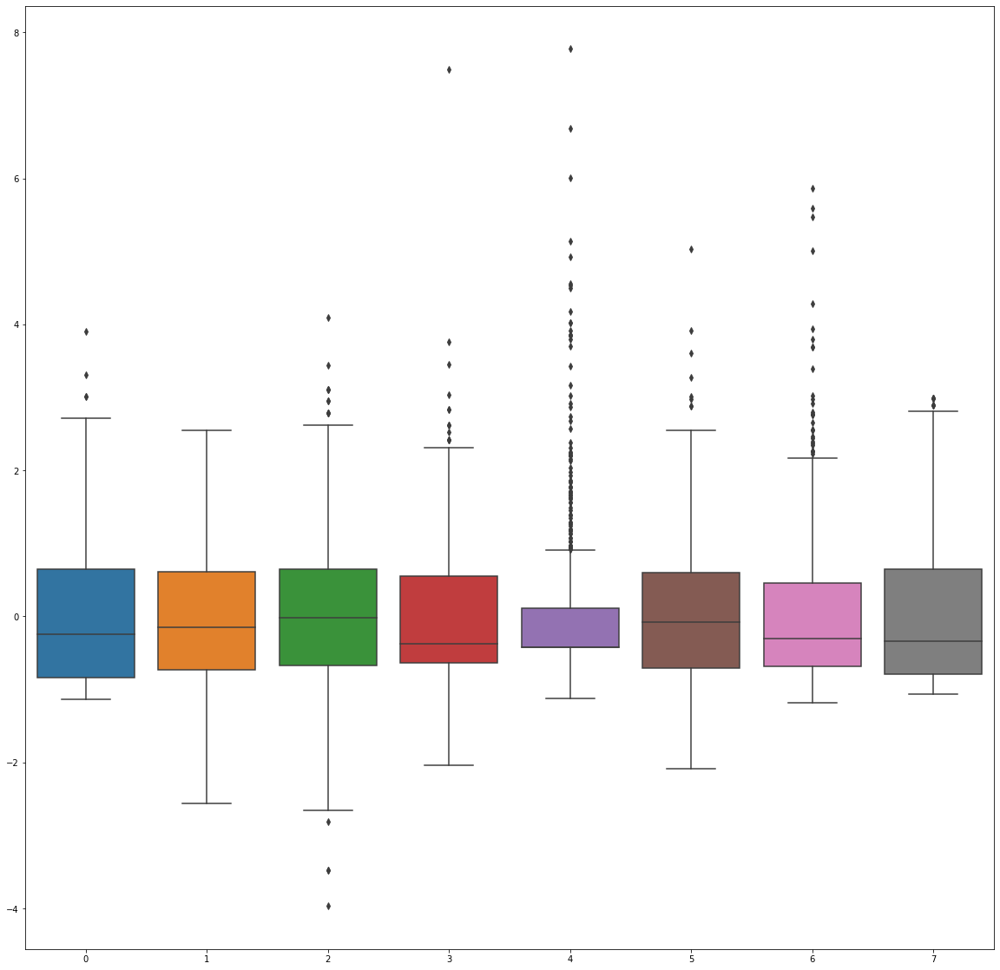

In [26]:
new_df_scalar = pd.DataFrame(scalar.fit_transform(x))
fig, ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = new_df_scalar, ax = ax)

In [27]:
x_scaled

array([[ 0.64327075,  0.87008298, -0.01698412, ...,  0.16090077,
         0.46879263,  1.54828125],
       [-0.83984741, -1.20656984, -0.51093456, ..., -0.85816238,
        -0.36177415, -0.16252742],
       [ 1.23651801,  2.02377899, -0.6755847 , ..., -1.33857787,
         0.60421113, -0.07248486],
       ...,
       [ 0.34664712, -0.01991109, -0.01698412, ..., -0.91639456,
        -0.68075995, -0.25256998],
       [-0.83984741,  0.14490263, -1.00488499, ..., -0.3486308 ,
        -0.36779275,  1.27815356],
       [-0.83984741, -0.9428679 , -0.18163427, ..., -0.30495667,
        -0.47010895, -0.88286791]])

In [28]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 759, dtype: int64

In [29]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])

In [30]:
vif_score(x)

,FEATURE,VIF_SCORE
0,Pregnancies,1.484572
1,Glucose,1.354580
2,BloodPressure,1.247898
3,SkinThickness,1.455095
4,Insulin,1.264776
5,BMI,1.551161
6,DiabetesPedigreeFunction,1.058847
7,Age,1.680199


In [31]:
x_train,x_test,y_train,y_test = train_test_split(x_scaled,y,test_size=0.20,random_state=144)

In [33]:
logr = LogisticRegression(verbose=1)

In [34]:
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [35]:
logr.predict([x_test[0]])

array([0], dtype=int64)

In [36]:
logr.predict_proba([x_test[0]])

array([[0.94265443, 0.05734557]])

In [37]:
logr.predict_log_proba([x_test[0]])

array([[-0.05905552, -2.85865975]])

In [38]:
logr.predict([x_test[1]])

array([0], dtype=int64)

In [39]:
logr.predict_log_proba([x_test[1]])

array([[-0.11855149, -2.19109813]])

In [40]:
type(y_test)

pandas.core.series.Series

In [41]:
y_test.iloc[0]

0

In [42]:
y_test

190    0
182    0
125    1
635    1
337    1
      ..
166    0
74     0
686    0
25     1
243    1
Name: Outcome, Length: 152, dtype: int64

In [43]:
logr_liblinear = LogisticRegression(verbose=1,solver='liblinear')

In [44]:
logr

LogisticRegression(verbose=1)

In [45]:
logr_liblinear

LogisticRegression(solver='liblinear', verbose=1)

In [47]:
logr_liblinear.fit(x_train,y_train )

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [48]:
y_pred_liblinear = logr_liblinear.predict(x_test)
y_pred_liblinear

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0],
      dtype=int64)

In [51]:
y_pred_default = logr.predict(x_test)
y_pred_default

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0],
      dtype=int64)

In [54]:
confusion_matrix(y_test,y_pred_liblinear)

array([[82, 12],
       [26, 32]], dtype=int64)

In [55]:
confusion_matrix(y_test,y_pred_default)

array([[82, 12],
       [26, 32]], dtype=int64)

In [56]:
def model_eval(y_true,y_pred):
    tn, fp, fn, tp = confusion_matrix(y_test,y_pred).ravel()
    accuracy=(tp+tn)/(tp+tn+fp+fn)
    precision=tp/(tp+fp)
    recall=tp/(tp+fn)
    specificity=tn/(fp+tn)
    F1_Score = 2*(recall * precision) / (recall + precision)
    result={"Accuracy":accuracy,"Precision":precision,"Recall":recall,'Specficity':specificity,'F1':F1_Score}
    return result
model_eval(y_test,y_pred_liblinear)

{'Accuracy': 0.75,
 'Precision': 0.7272727272727273,
 'Recall': 0.5517241379310345,
 'Specficity': 0.8723404255319149,
 'F1': 0.6274509803921569}

In [58]:
model_eval(y_test,y_pred_default)

{'Accuracy': 0.75,
 'Precision': 0.7272727272727273,
 'Recall': 0.5517241379310345,
 'Specficity': 0.8723404255319149,
 'F1': 0.6274509803921569}

In [64]:
auc = roc_auc_score(y_test,y_pred_liblinear)

In [65]:
roc_auc_score(y_test,y_pred_default)

0.7120322817314747

In [66]:
roc_curve(y_test,y_pred_liblinear)

(array([0.        , 0.12765957, 1.        ]),
 array([0.        , 0.55172414, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [67]:
fpr, tpr, thresholds  = roc_curve(y_test,y_pred_liblinear)

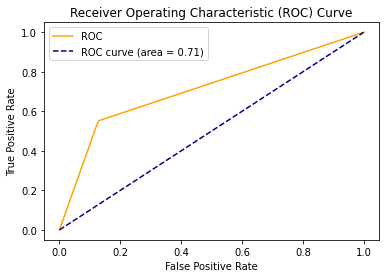

In [68]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()